#### Loading packages and data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno


**old_zri** is the old zillow index.
**new_zri** is the new zillow index on their website.

In [2]:
old_zri = pd.read_csv('Zip_Zri_MultiFamilyResidenceRental.csv')
new_zri = pd.read_csv('zori.csv')



old_zri has more dates included in it's data set, shown by its number of columns. But it ends at the start of 2020. new_zri suprisingly has more rows. that means that it has **more** zipcodes.

In [3]:
old_zri.shape

(1861, 120)

In [4]:
new_zri.shape

(2233, 95)

In [5]:
old_zri.head(10)

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2010-09,2010-10,2010-11,...,2019-04,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12,2020-01
0,61639,10025,New York,NY,New York-Newark-Jersey City,New York County,1,2930.0,2952.0,2926.0,...,3484.0,3523.0,3573.0,3622.0,3664.0,3698.0,3704.0,3692.0,3715.0,3676.0
1,84654,60657,Chicago,IL,Chicago-Naperville-Elgin,Cook County,2,1447.0,1465.0,1469.0,...,1731.0,1749.0,1768.0,1787.0,1801.0,1806.0,1789.0,1761.0,1747.0,1731.0
2,61637,10023,New York,NY,New York-Newark-Jersey City,New York County,3,2797.0,2811.0,2813.0,...,3449.0,3459.0,3479.0,3491.0,3510.0,3521.0,3574.0,3608.0,3561.0,NaN
3,91982,77494,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,4,NaN,NaN,NaN,...,1226.0,1250.0,1264.0,1251.0,1246.0,1252.0,1280.0,1310.0,1294.0,1286.0
4,84616,60614,Chicago,IL,Chicago-Naperville-Elgin,Cook County,5,1437.0,1469.0,1490.0,...,1888.0,1911.0,1934.0,1950.0,1953.0,1952.0,1921.0,1958.0,NaN,1916.0
5,91940,77449,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1314.0,1321.0,NaN,1353.0
6,61616,10002,New York,NY,New York-Newark-Jersey City,New York County,7,NaN,NaN,NaN,...,3406.0,3408.0,3420.0,3432.0,3440.0,3481.0,3437.0,3485.0,NaN,3538.0
7,91733,77084,Houston,TX,Houston-The Woodlands-Sugar Land,Harris County,8,NaN,NaN,NaN,...,1305.0,1301.0,1298.0,1298.0,1298.0,1307.0,1306.0,1311.0,NaN,1367.0
8,93144,79936,El Paso,TX,El Paso,El Paso County,9,982.0,987.0,973.0,...,881.0,879.0,881.0,879.0,879.0,877.0,877.0,883.0,895.0,898.0
9,84640,60640,Chicago,IL,Chicago-Naperville-Elgin,Cook County,10,1207.0,1224.0,1220.0,...,1503.0,1505.0,1507.0,1506.0,1503.0,1498.0,1506.0,1494.0,1498.0,1497.0


In [6]:
new_zri.head(10)

,RegionID,RegionName,SizeRank,MsaName,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,...,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07
0,61639,10025,1,"New York, NY",2889.0,2904.0,2919.0,2934.0,2949.0,2963.0,...,2954.0,2944.0,2934.0,2924.0,2917.0,2909.0,2902.0,2899.0,2897.0,2894.0
1,84654,60657,2,"Chicago, IL",1406.0,1411.0,1416.0,1422.0,1426.0,1431.0,...,1597.0,1595.0,1593.0,1591.0,1590.0,1588.0,1587.0,1586.0,1585.0,1584.0
2,61637,10023,3,"New York, NY",3003.0,3012.0,3022.0,3031.0,3041.0,3050.0,...,2949.0,2937.0,2925.0,2913.0,2904.0,2894.0,2885.0,2880.0,2874.0,2869.0
3,91982,77494,4,"Houston, TX",1390.0,1387.0,1384.0,1381.0,1379.0,1376.0,...,1378.0,1387.0,1395.0,1404.0,1414.0,1423.0,1432.0,1442.0,1452.0,1462.0
4,84616,60614,5,"Chicago, IL",1692.0,1697.0,1702.0,1707.0,1712.0,1716.0,...,1922.0,1922.0,1922.0,1921.0,1922.0,1922.0,1922.0,1924.0,1926.0,1928.0
5,91940,77449,6,"Houston, TX",1202.0,1205.0,1209.0,1213.0,1217.0,1221.0,...,1438.0,1452.0,1466.0,1479.0,1494.0,1508.0,1522.0,1537.0,1552.0,1567.0
6,61616,10002,7,"New York, NY",2723.0,2739.0,2755.0,2770.0,2786.0,2802.0,...,2852.0,2838.0,2824.0,2810.0,2800.0,2789.0,2779.0,2774.0,2768.0,2763.0
7,91733,77084,8,"Houston, TX",1058.0,1065.0,1071.0,1077.0,1083.0,1089.0,...,1289.0,1298.0,1306.0,1315.0,1324.0,1333.0,1342.0,1351.0,1361.0,1370.0
8,93144,79936,9,"El Paso, TX",887.0,886.0,885.0,885.0,884.0,884.0,...,986.0,993.0,999.0,1005.0,1011.0,1017.0,1024.0,1030.0,1036.0,1043.0
9,84640,60640,10,"Chicago, IL",1249.0,1250.0,1252.0,1253.0,1254.0,1256.0,...,1418.0,1416.0,1415.0,1413.0,1411.0,1410.0,1408.0,1407.0,1406.0,1404.0


#### old_zri entire data set

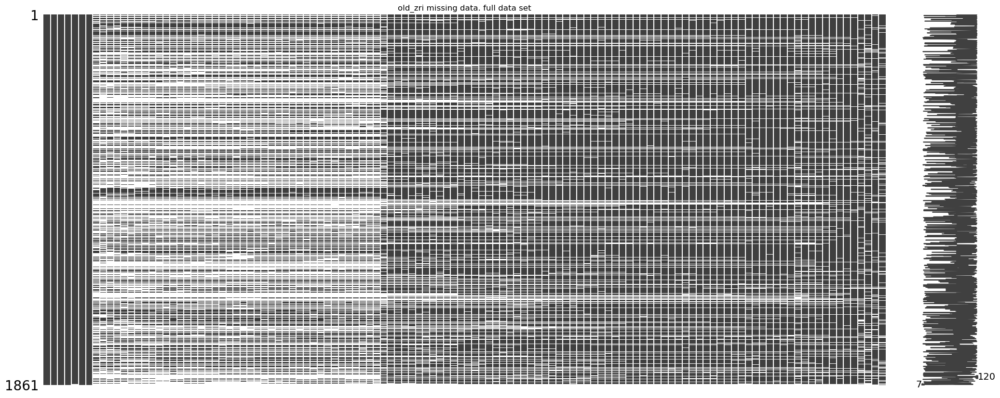

In [7]:
msno.matrix(old_zri)
plt.title('old_zri missing data. full data set')
plt.show()

#### old_zri by state

In [8]:
states_list = list(old_zri.groupby('State').agg({'RegionName':
                                             'count'}).sort_values('RegionName',
                                                                   ascending=False).index)

In [9]:
len(states_list)

46

old_zri has more dates but a lot of the missing values are before 2014. So the start date for a lot of these predictions will be the same for old or new zri.

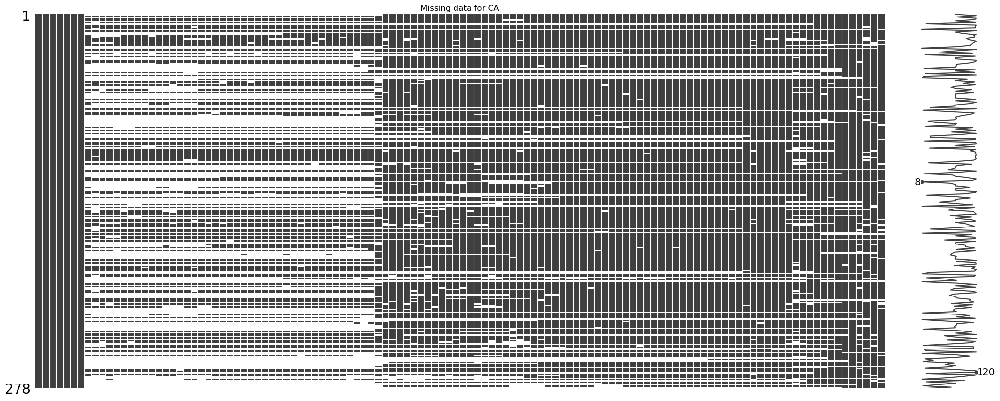

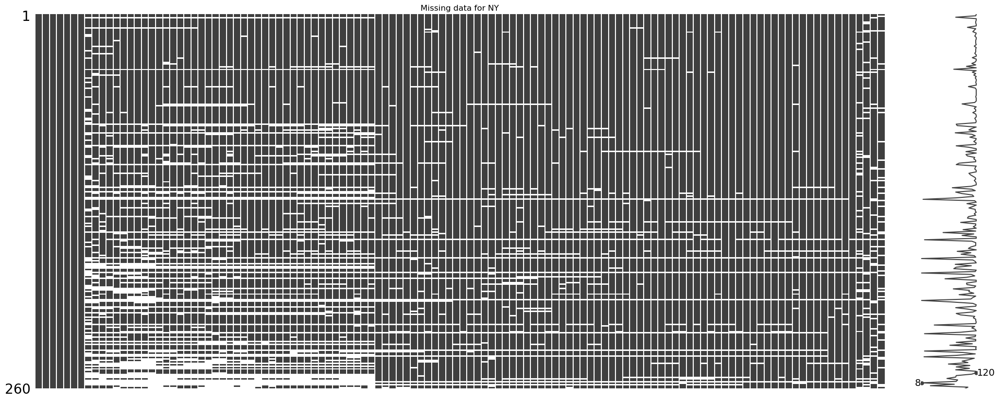

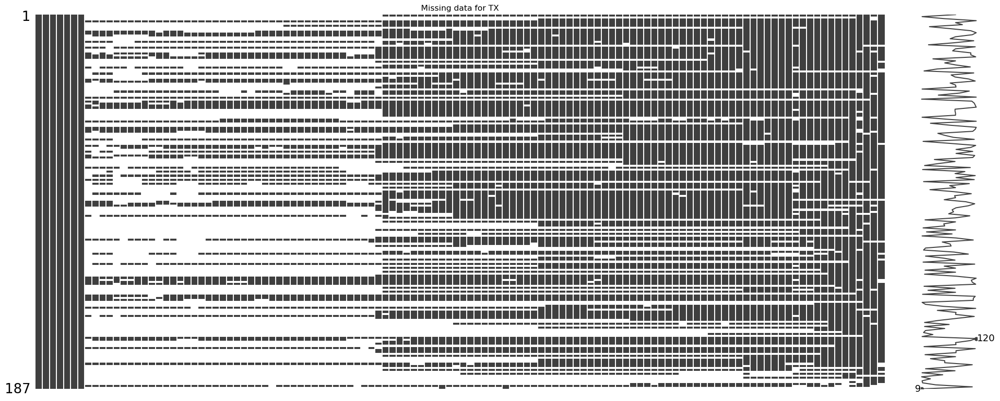

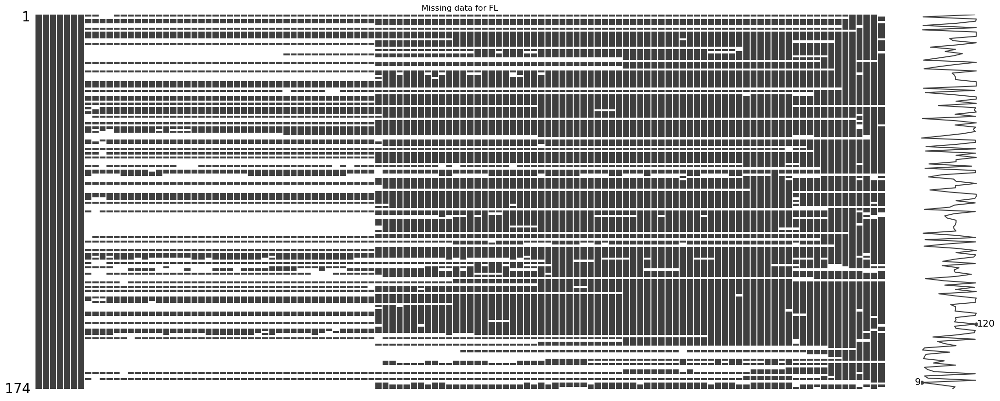

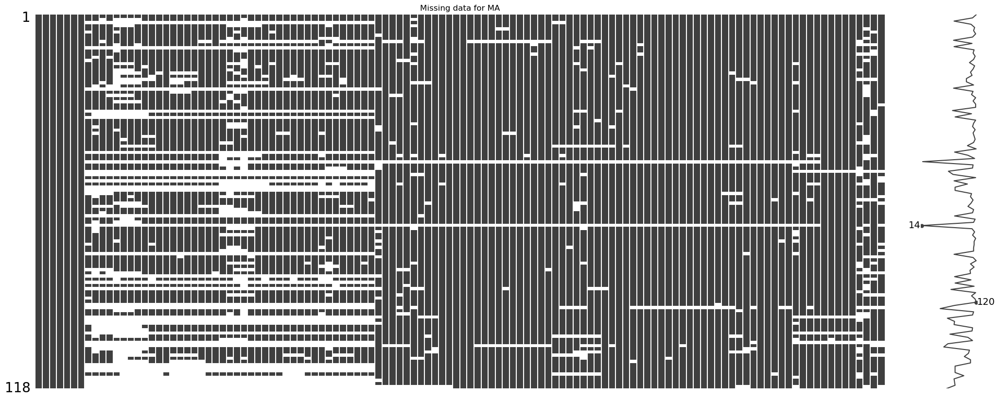

...

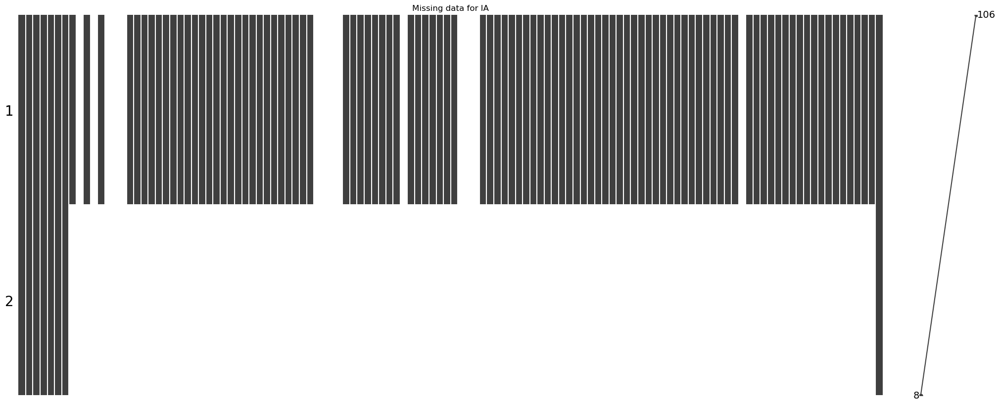

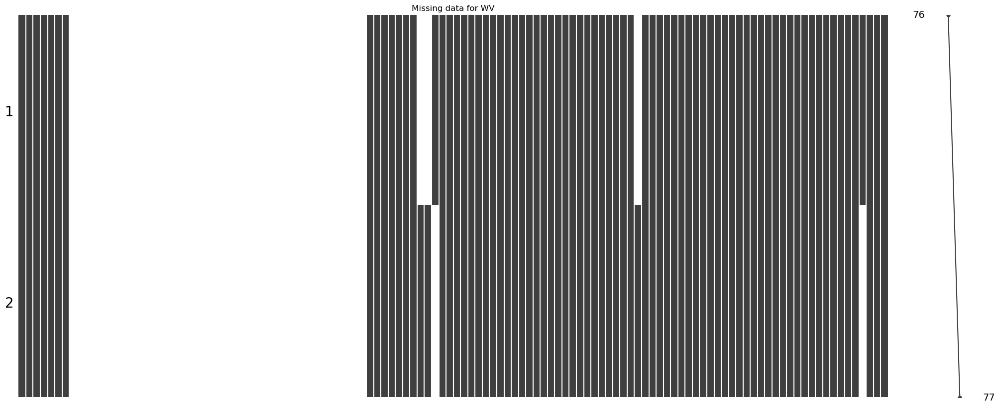

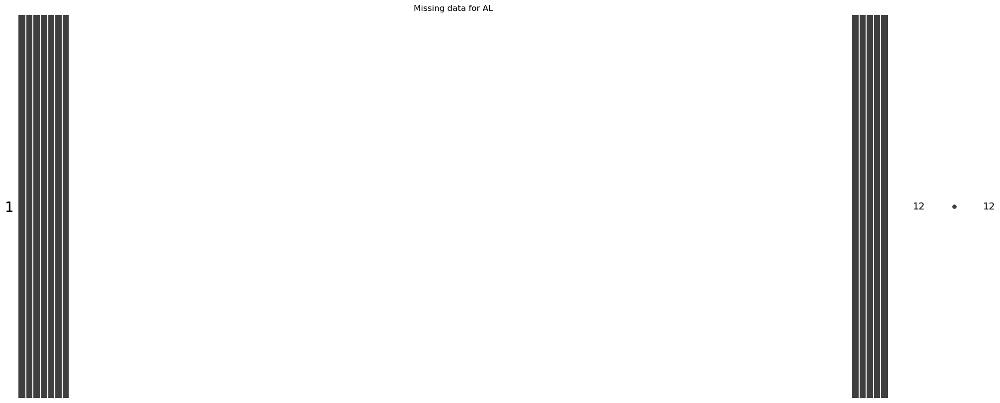

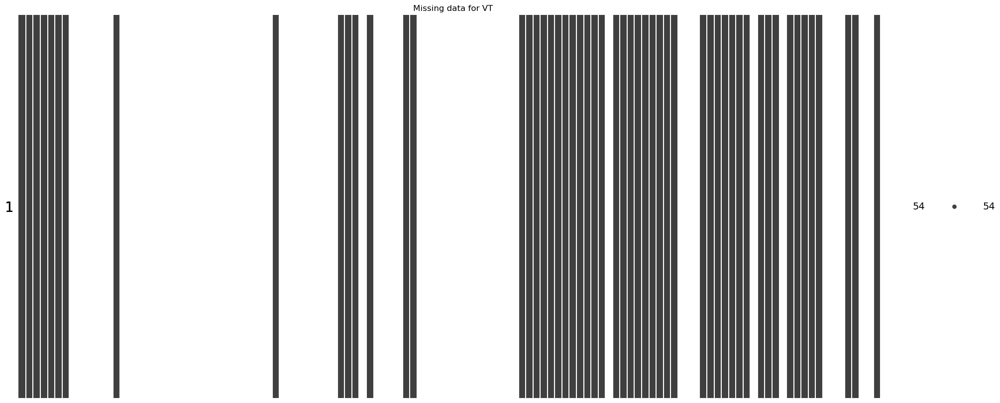

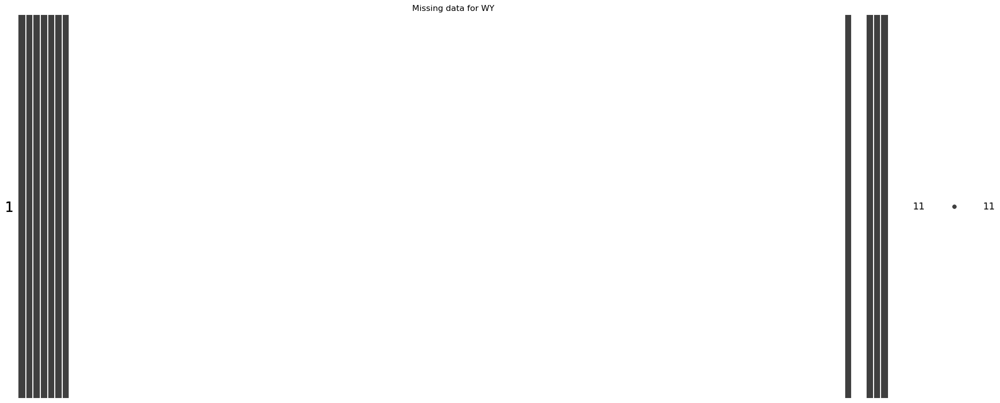

In [10]:
for state in states_list:
    msno.matrix(old_zri[old_zri['State']==state])
    plt.title(f'Missing data for {state}')
    plt.show()

#### old_zri by metro

In [11]:
metro_list = list(old_zri.groupby('Metro').agg({'RegionName':
                                             'count'}).sort_values('RegionName',
                                                                   ascending=False).index)

In [12]:
len(metro_list)

188

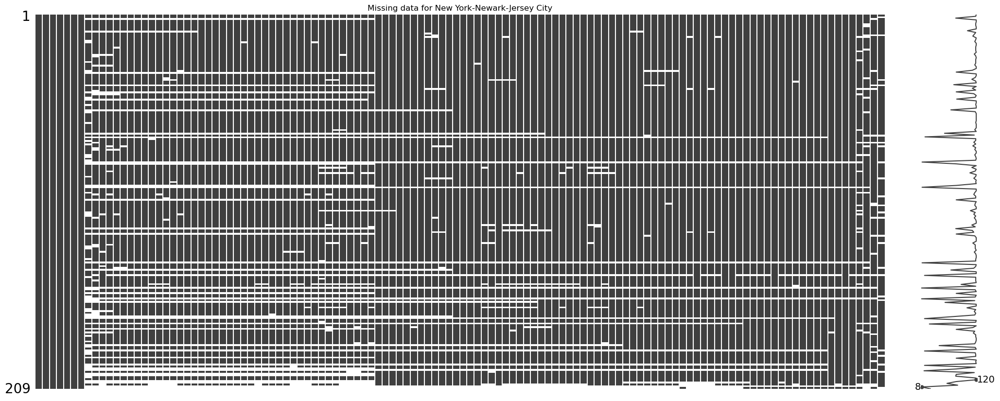

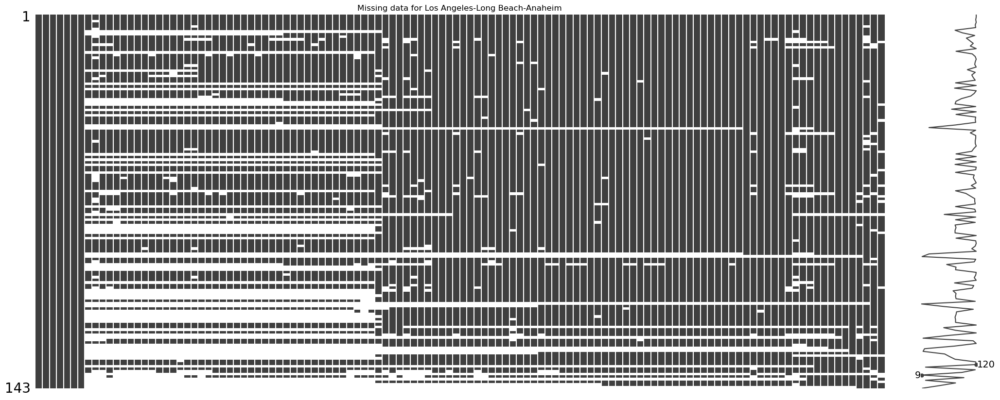

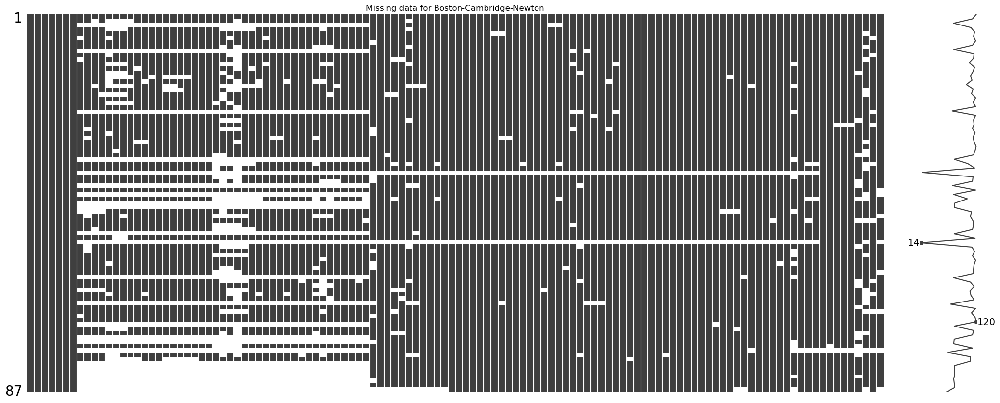

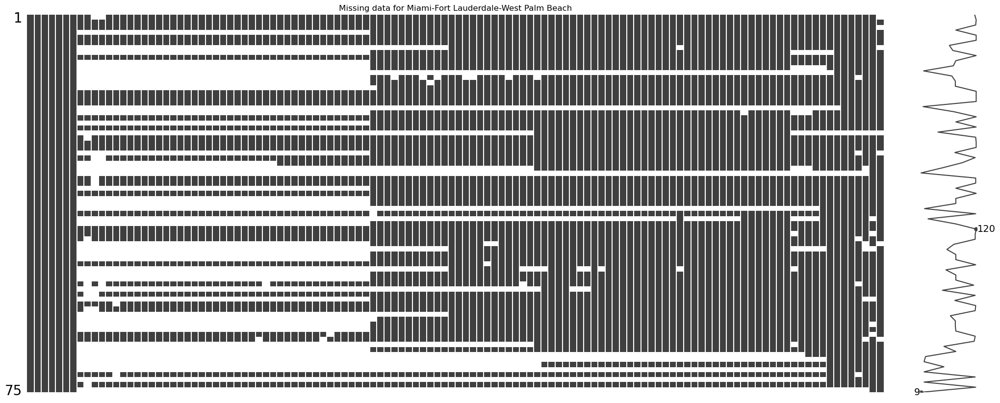

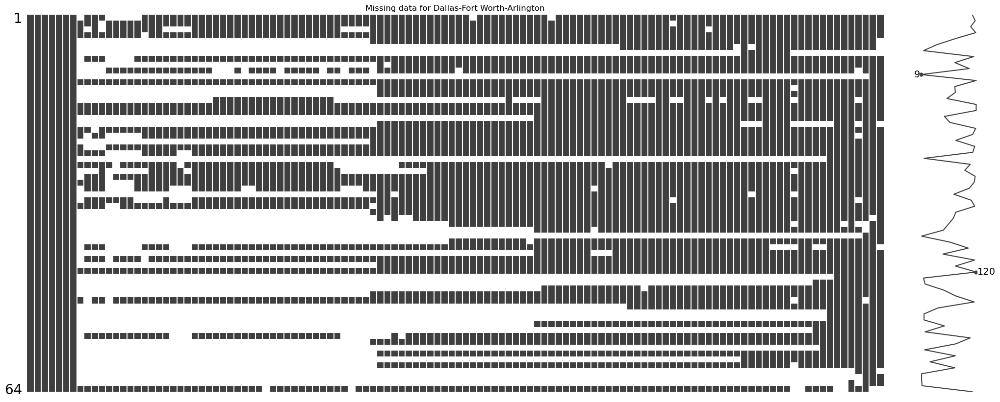

...

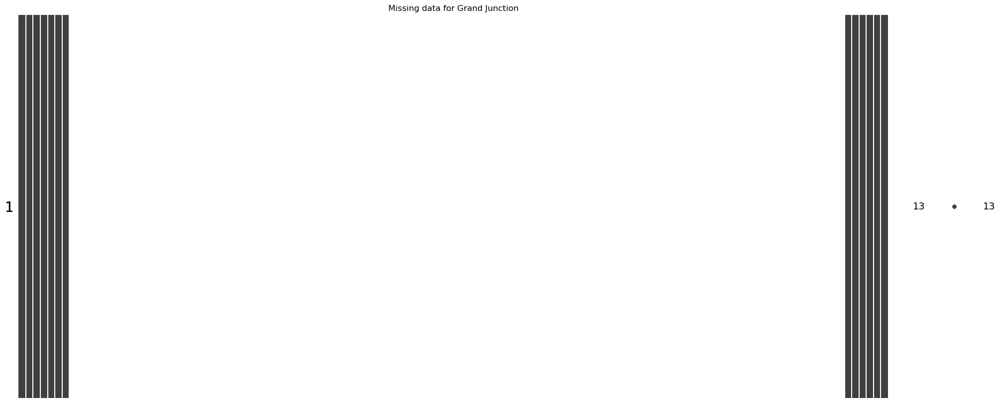

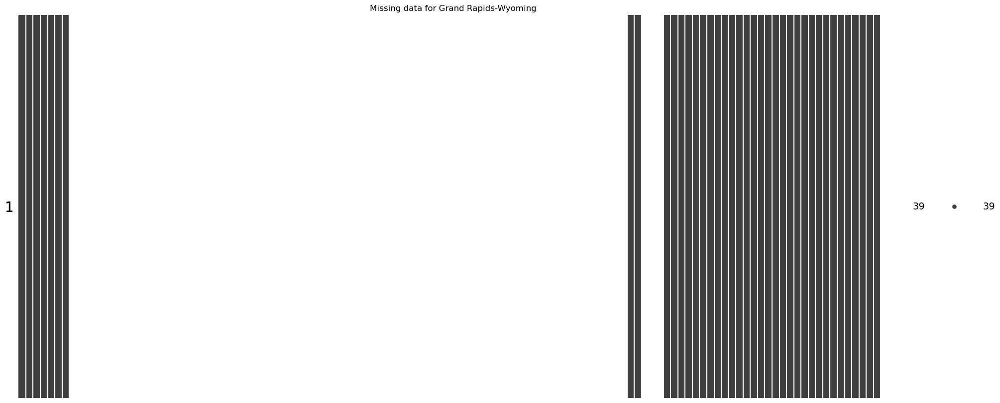

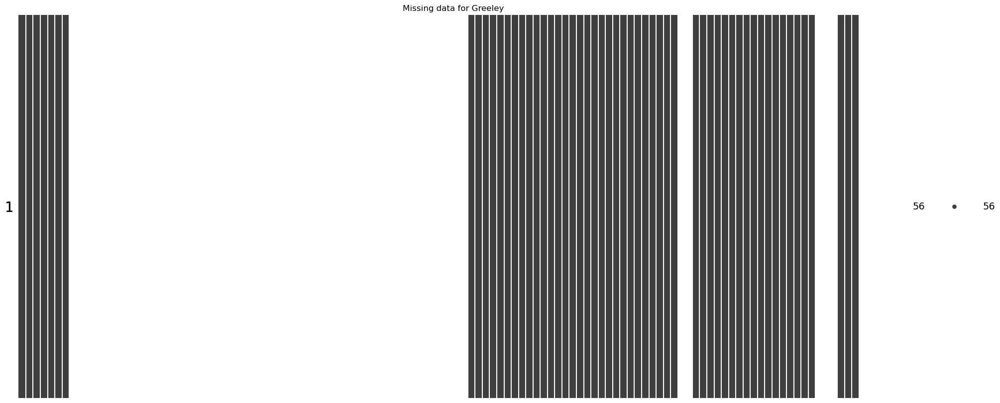

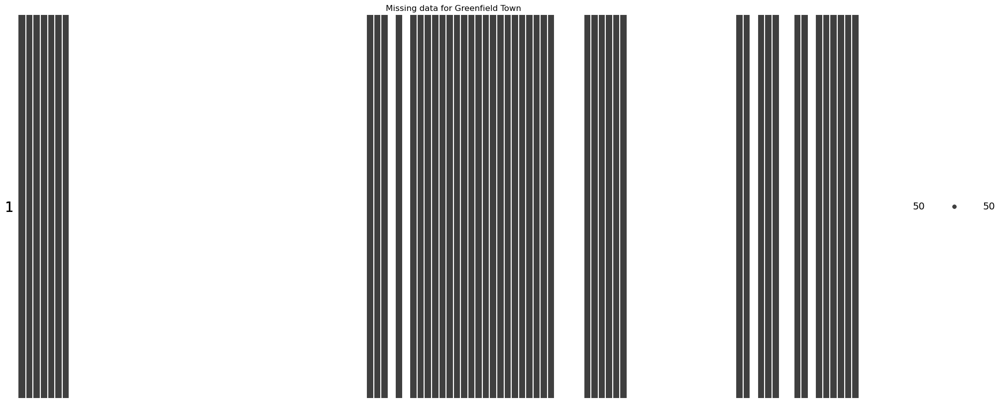

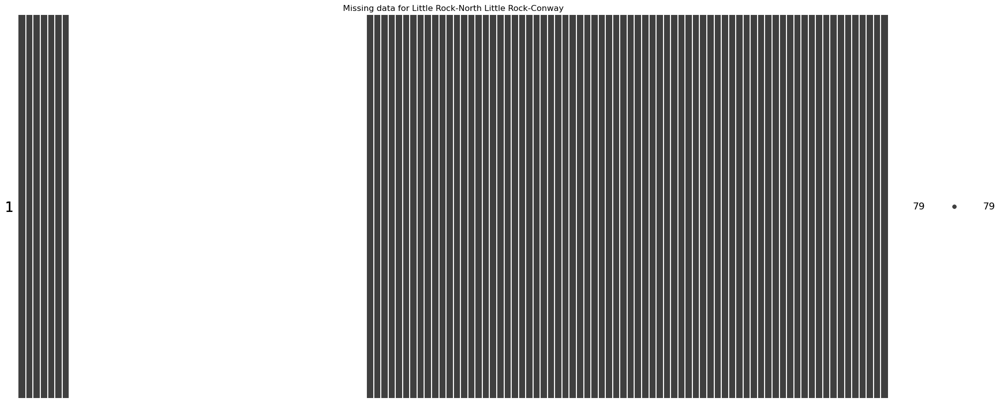

In [13]:
for metro in metro_list:
    msno.matrix(old_zri[old_zri['Metro']==metro])
    plt.title(f'Missing data for {metro}')
    plt.show()

#### new_zri entire dataset

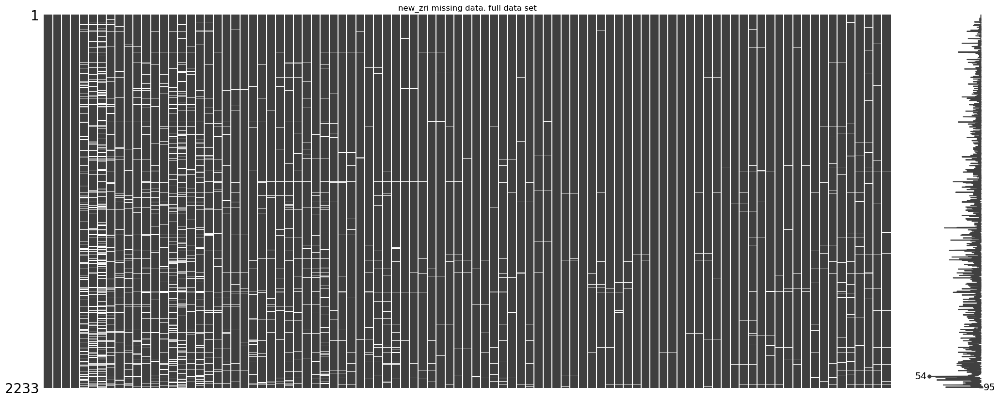

In [14]:
msno.matrix(new_zri)
plt.title('new_zri missing data. full data set')
plt.show()

#### new_zri by metro

In [15]:
Msa_list = list(new_zri.groupby('MsaName').agg({'RegionName':
                                             'count'}).sort_values('RegionName',
                                                                   ascending=False).index)

In [16]:
len(Msa_list)

87

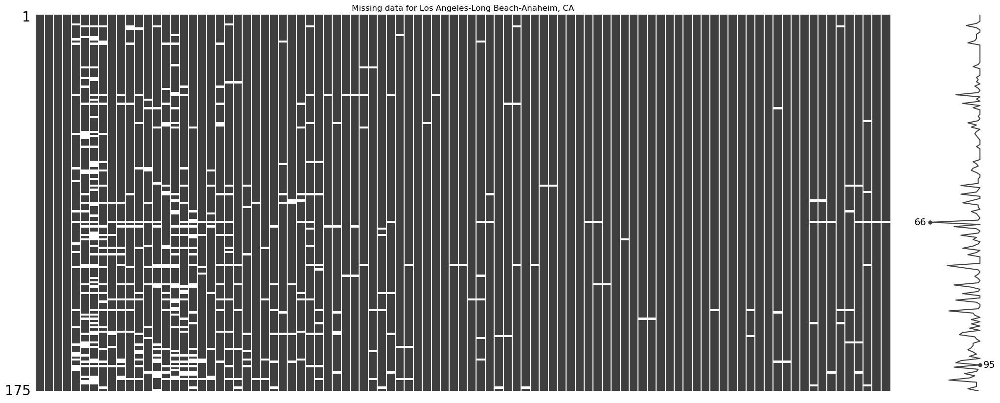

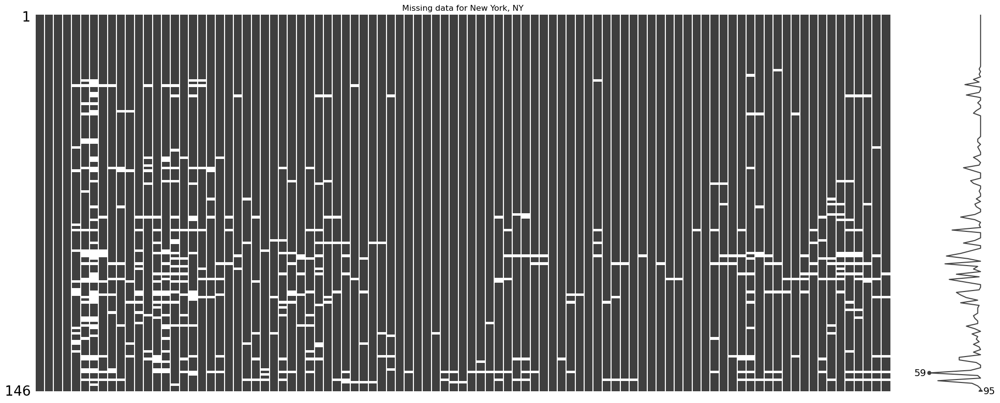

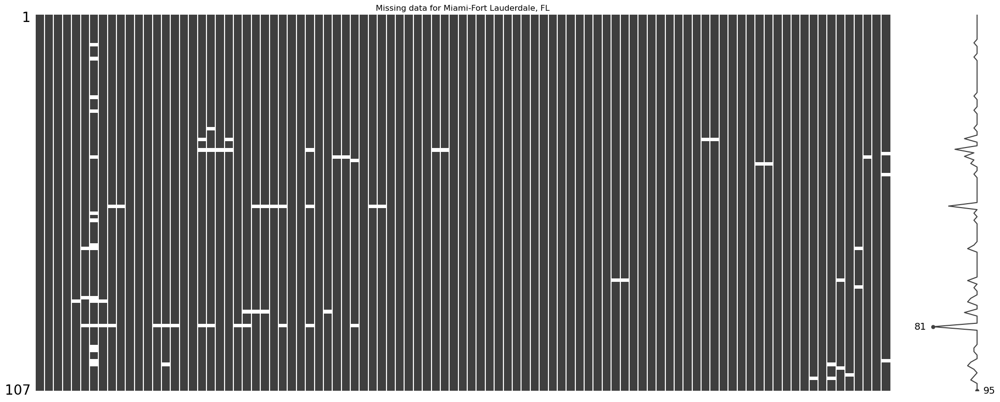

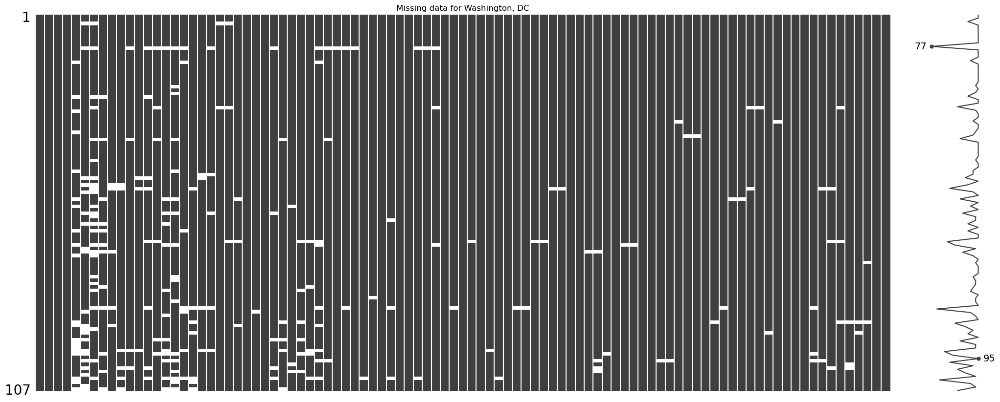

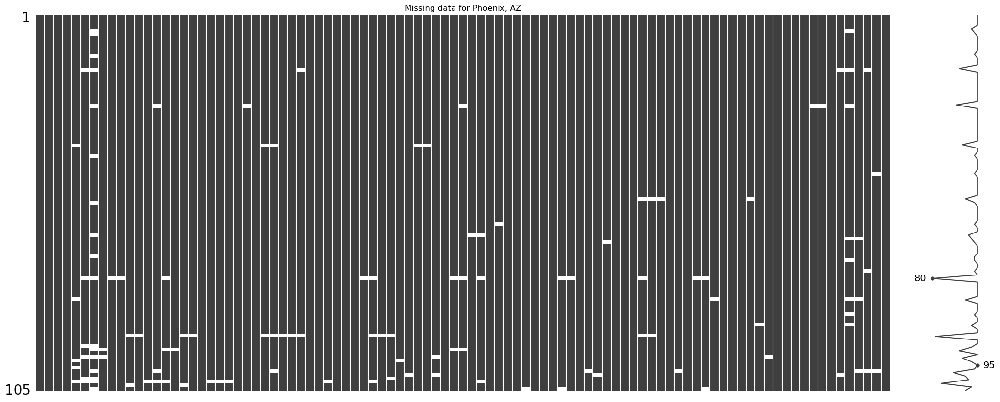

...

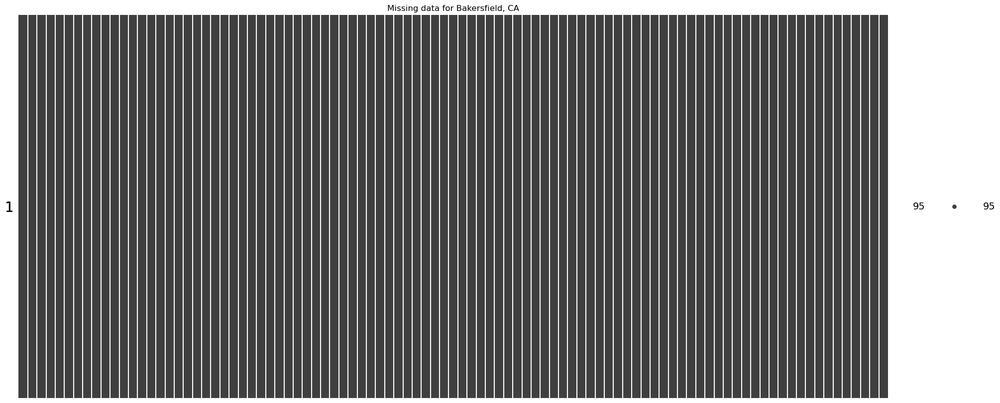

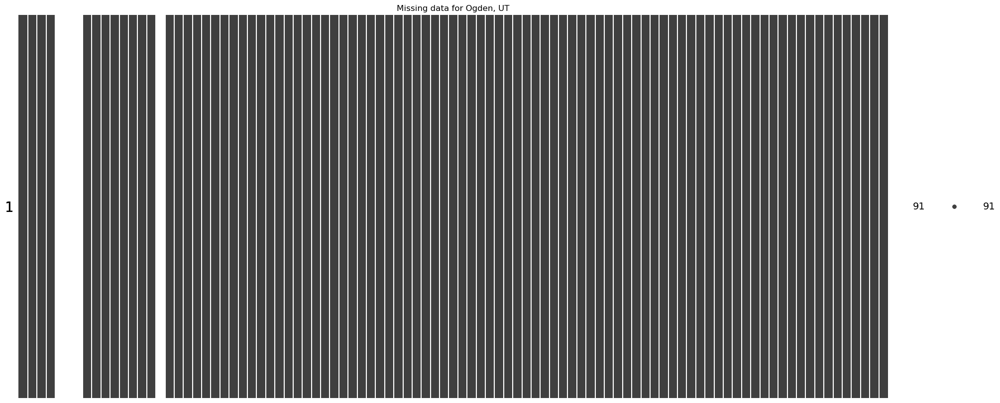

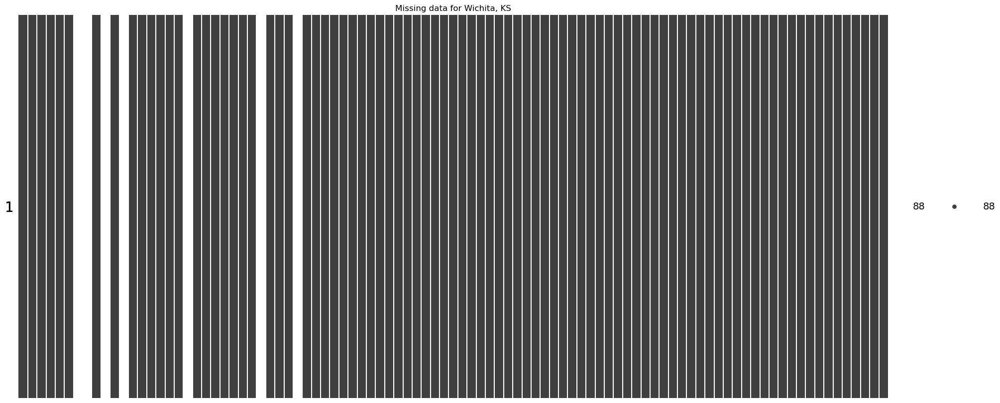

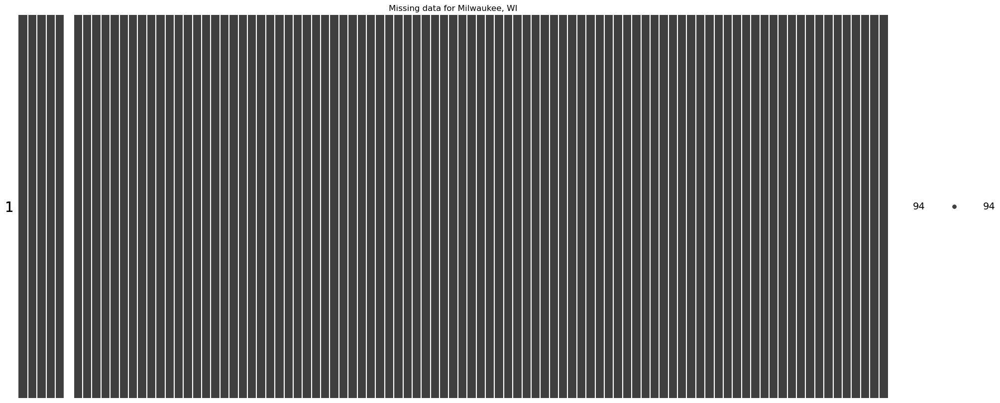

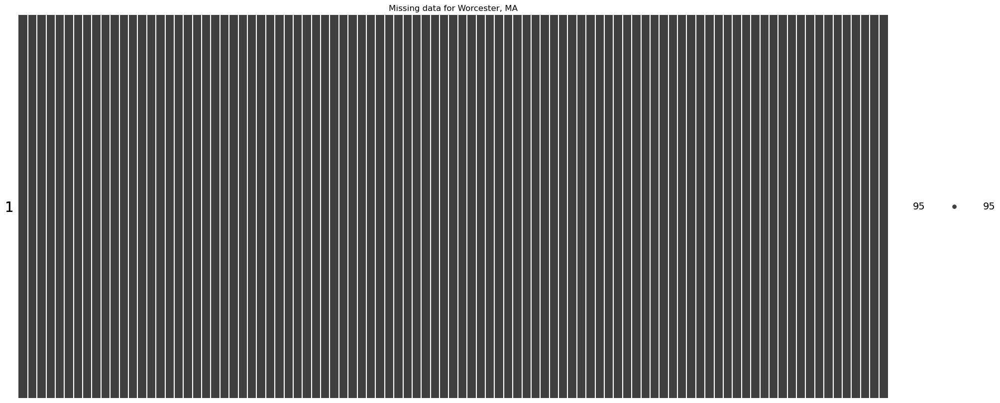

In [17]:
for msa in Msa_list:
    msno.matrix(new_zri[new_zri['MsaName']==msa])
    plt.title(f'Missing data for {msa}')
    plt.show()